# Percobaan 0

**Pipeline:** Resize (256×256) → Grayscale

In [45]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from skimage.feature import graycomatrix, graycoprops
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (accuracy_score, classification_report, confusion_matrix)

# 1. Import Library
Pada tahap ini dilakukan pemanggilan berbagai library yang dibutuhkan selama proses pengolahan citra, ekstraksi fitur, visualisasi data, serta pembuatan model klasifikasi.

In [46]:
def resize_grayscale(img):
    img_resize = cv2.resize(img, (256,256))
    img_gray = cv2.cvtColor(img_resize, cv2.COLOR_BGR2GRAY)
    
    return img_gray

# 2. Fungsi Preprocessing

Pada bagian ini dibuat fungsi preprocessing yang akan digunakan untuk mengubah ukuran gambar menjadi 256×256 piksel dan mengonversinya ke format grayscale. Fungsi ini bertujuan agar seluruh gambar memiliki ukuran dan format yang seragam sebelum diproses lebih lanjut.

In [47]:
TRAIN_PATH = os.path.join("Dataset", "Train")
LABELS = {"Benign":"benign", "Malignant":"malignant"}

data = {}

for label, folder in LABELS.items():

    path = os.path.join(TRAIN_PATH, folder)
    images = []
    filenames = []

    for file in sorted(os.listdir(path)):

        if file.lower().endswith((".jpg",".jpeg",".png")):
            img = cv2.imread(os.path.join(path,file))

            if img is not None:
                images.append(img)
                filenames.append(file)

    data[label] = {"images":images, "filenames":filenames}

    print(label, len(images))

Benign 80
Malignant 80


# 3. Load Dataset

Tahap ini digunakan untuk membaca seluruh gambar dari dataset dan mengelompokkannya berdasarkan label kelas yang tersedia. Data yang berhasil dibaca kemudian disimpan agar dapat digunakan pada proses berikutnya.

# 4. Menampilkan Citra Awal Dataset

Pada tahap ini ditampilkan seluruh citra pada masing-masing kelas beserta informasi dasarnya, seperti jumlah gambar dan ukuran citra. Tujuannya adalah untuk melihat kondisi awal dataset serta memastikan data telah berhasil dimuat dengan benar sebelum dilakukan proses preprocessing.


Label : Benign
Jumlah gambar : 80
Ukuran gambar pertama : 224 x 224
Channel : 3


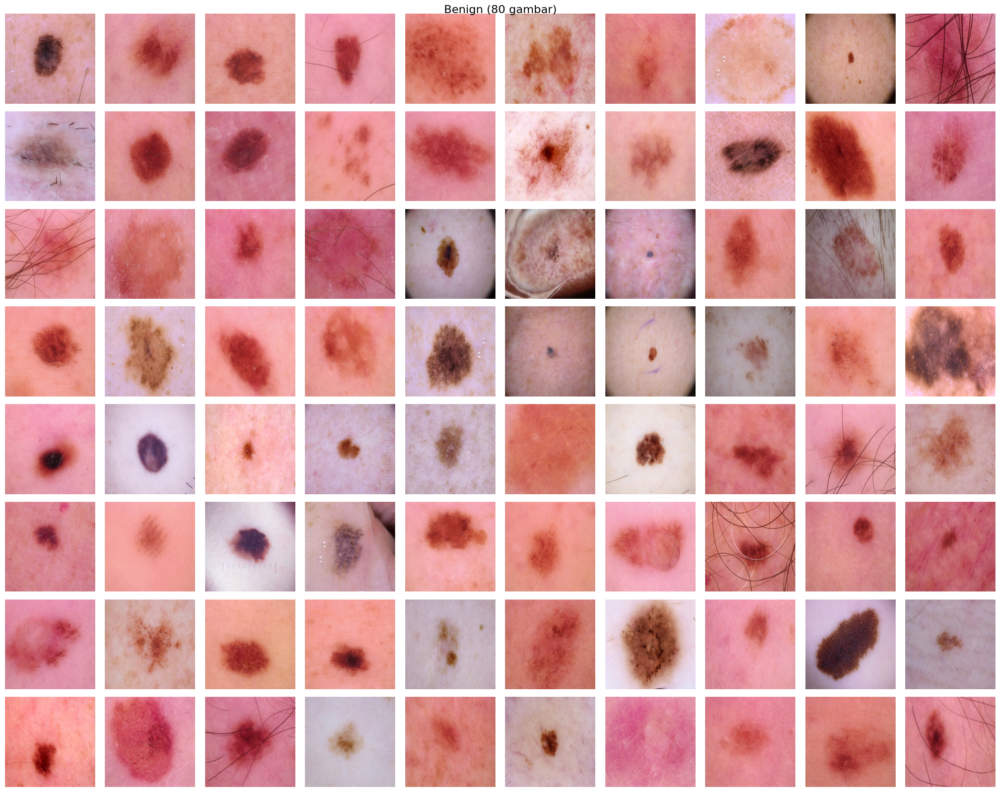


Label : Malignant
Jumlah gambar : 80
Ukuran gambar pertama : 224 x 224
Channel : 3


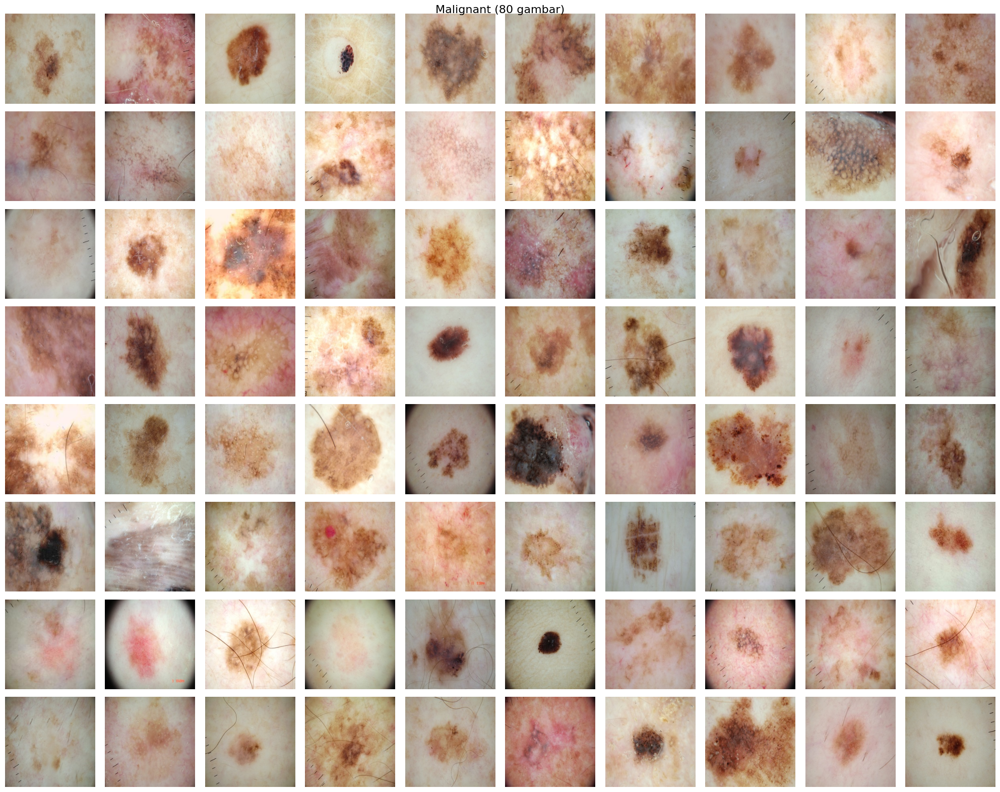

In [48]:
for label in data:

    imgs = data[label]["images"]
    jumlah_gambar = len(imgs)
    tinggi = imgs[0].shape[0]
    lebar = imgs[0].shape[1]

    if len(imgs[0].shape) == 3:
        channel = imgs[0].shape[2]
    else:
        channel = 1

    print(f"\nLabel : {label}")
    print(f"Jumlah gambar : {jumlah_gambar}")
    print(f"Ukuran gambar pertama : {lebar} x {tinggi}")
    print(f"Channel : {channel}")

    cols = 10
    rows = (jumlah_gambar + cols - 1) // cols
    fig, axes = plt.subplots(rows,cols,figsize=(20, rows * 2))
    fig.suptitle(f"{label} ({jumlah_gambar} gambar)",fontsize=16)
    axes = axes.flatten()

    for i, ax in enumerate(axes):

        if i < jumlah_gambar:
            img = cv2.cvtColor(imgs[i],cv2.COLOR_BGR2RGB)
            ax.imshow(img)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

In [49]:
for label in data:

    gray_list = []
    for img in data[label]["images"]:

        gray = resize_grayscale(img)
        gray_list.append(gray)

    data[label]["gray"] = gray_list

# 5. Menerapkan Preprocessing

Tahap ini digunakan untuk menerapkan proses resize dan grayscale pada seluruh citra dalam dataset. Hasil preprocessing kemudian disimpan untuk digunakan pada tahapan selanjutnya.

# 6. Perbandingan Citra Sebelum dan Sesudah Preprocessing

Tahap ini digunakan untuk menampilkan beberapa sampel citra asli dan hasil preprocessing secara berdampingan sehingga perubahan pada citra dapat diamati dengan lebih mudah.

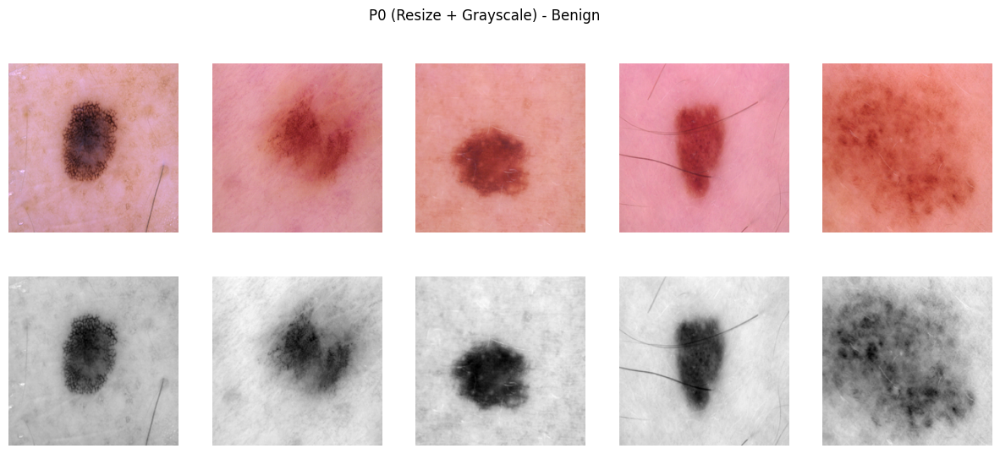

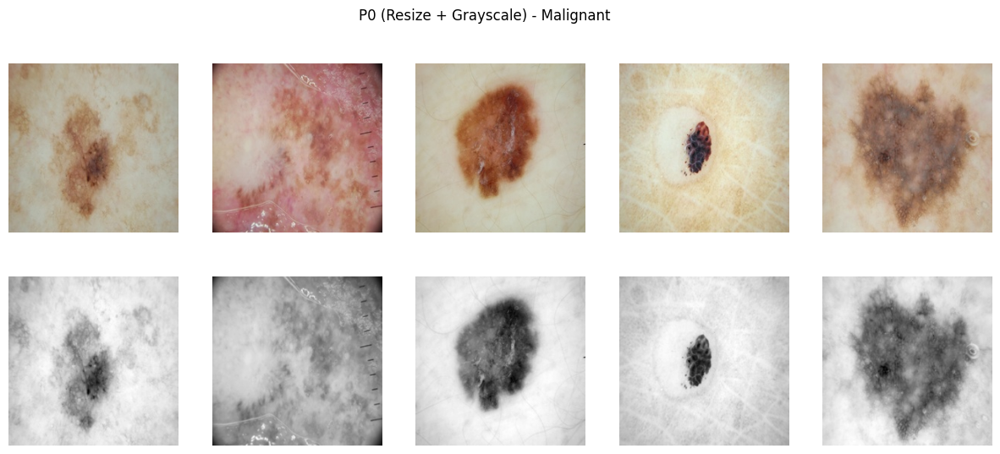

In [50]:
N = 5

for label in data:

    fig, axes = plt.subplots(2,N,figsize=(15,6))
    fig.suptitle(f"P0 (Resize + Grayscale) - {label}")

    for i in range(N):

        original = cv2.cvtColor(data[label]["images"][i], cv2.COLOR_BGR2RGB)
        gray = data[label]["gray"][i]
        axes[0,i].imshow(original)
        axes[0,i].axis("off")
        axes[1,i].imshow(gray, cmap="gray")
        axes[1,i].axis("off")

    plt.show()

# 7. Menampilkan Seluruh Hasil Preprocessing

Tahap ini digunakan untuk menampilkan seluruh citra hasil preprocessing beserta ukuran akhirnya. Tujuannya adalah untuk memastikan proses resize dan grayscale telah diterapkan secara konsisten pada seluruh dataset.

Ukuran setelah preprocessing: (256, 256)


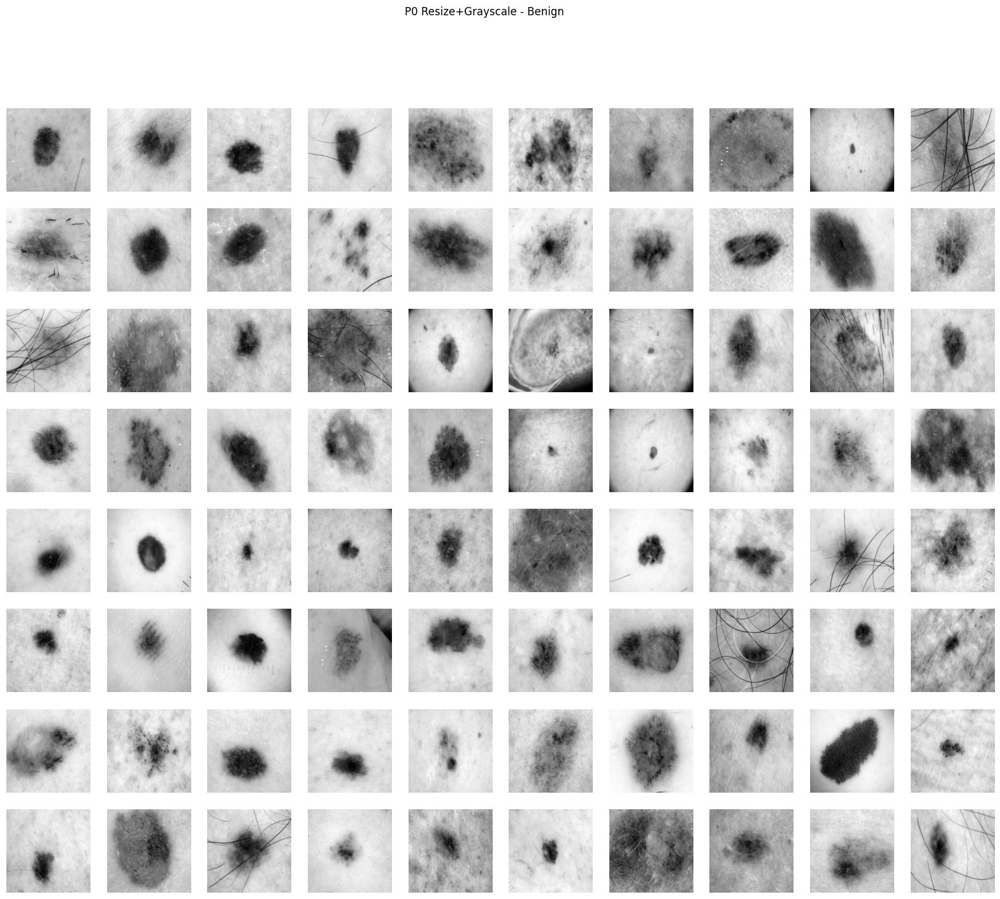

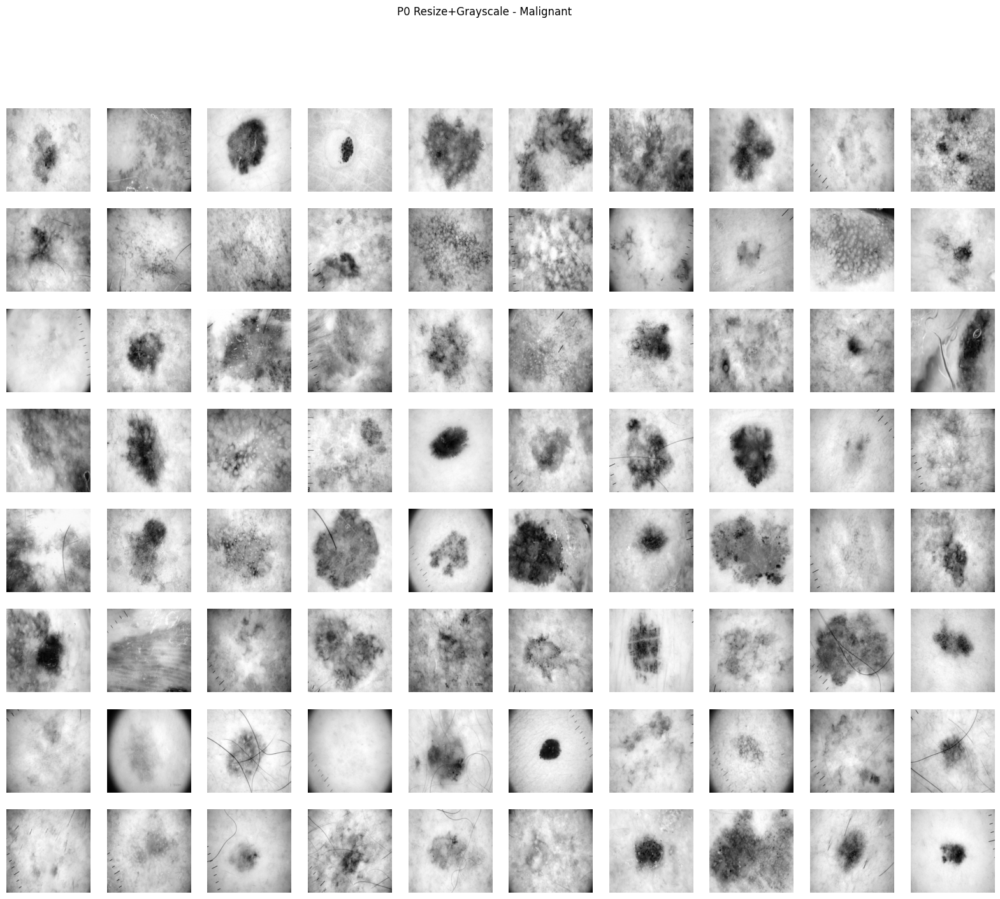

In [51]:
def plot_all(imgs, label, cols=10):
    n = len(imgs)
    rows = int(np.ceil(n/cols))

    fig, axes = plt.subplots(rows,cols,figsize=(20,rows*2))
    fig.suptitle(f"P0 Resize+Grayscale - {label}")
    axes = axes.flatten()

    for i, ax in enumerate(axes):
        if i < n:
            ax.imshow(imgs[i],cmap="gray")
        ax.axis("off")
        
    plt.show()

print("Ukuran setelah preprocessing:",data[label]["gray"][0].shape)
plot_all(data["Benign"]["gray"],"Benign")
plot_all(data["Malignant"]["gray"],"Malignant")

In [ ]:
def ekstrak_fitur_glcm(data, nama_prepro):

    fitur_list = []

    sudut_map = {
        0: 0,
        45: np.pi/4,
        90: np.pi/2,
        135: 3*np.pi/4
    }

    for img in data:

        fitur = {}

        for sudut, angle in sudut_map.items():

            glcm = graycomatrix(img,distances=[1],angles=[angle],symmetric=True,normed=True)

            fitur[f'Contrast_{sudut}'] = graycoprops(glcm, 'contrast')[0,0]
            fitur[f'Correlation_{sudut}'] = graycoprops(glcm, 'correlation')[0,0]
            fitur[f'Energy_{sudut}'] = graycoprops(glcm, 'energy')[0,0]
            fitur[f'Homogeneity_{sudut}'] = graycoprops(glcm, 'homogeneity')[0,0]
            fitur[f'Dissimilarity_{sudut}'] = graycoprops(glcm, 'dissimilarity')[0,0]
            fitur[f'ASM_{sudut}'] = graycoprops(glcm, 'ASM')[0,0]

        fitur_list.append(fitur)

    df = pd.DataFrame(fitur_list)
    df["tahap"] = nama_prepro

    return df

# 8. Ekstraksi Fitur GLCM

Proses ini bertujuan untuk memperoleh karakteristik tekstur dari setiap citra menggunakan metode GLCM. Ekstraksi dilakukan pada sudut 0°, 45°, 90°, dan 135°, kemudian dihitung beberapa fitur tekstur seperti Contrast, Correlation, Energy, Homogeneity, Dissimilarity, dan ASM. Hasil ekstraksi disimpan dalam bentuk tabel dan digunakan sebagai data masukan pada tahap klasifikasi.

# 9. Penyusunan Dataset Hasil Ekstraksi

Hasil ekstraksi fitur dari citra Benign dan Malignant digabungkan ke dalam satu dataset. Pada tahap ini juga ditambahkan informasi nama file dan label kelas untuk setiap citra. Dataset yang telah terbentuk kemudian ditampilkan dan disimpan dalam format CSV sebagai data yang akan digunakan pada proses pelatihan dan pengujian model klasifikasi.

In [53]:
df_benign = ekstrak_fitur_glcm(data["Benign"]["gray"],"P0")
df_benign["File"] = data["Benign"]["filenames"]
df_benign["Label"] = "Benign"

df_malignant = ekstrak_fitur_glcm(data["Malignant"]["gray"],"P0")
df_malignant["File"] = data["Malignant"]["filenames"]
df_malignant["Label"] = "Malignant"

df_fitur = pd.concat([df_benign, df_malignant],ignore_index=True)

display(df_fitur)
df_fitur.to_csv("hasil_ekstraksi_0.csv",index=False)

,Contrast_0,Correlation_0,Energy_0,Homogeneity_0,Dissimilarity_0,ASM_0,Contrast_45,Correlation_45,Energy_45,Homogeneity_45,...,ASM_90,Contrast_135,Correlation_135,Energy_135,Homogeneity_135,Dissimilarity_135,ASM_135,tahap,File,Label
0,21.143781,0.991516,0.055915,0.373525,2.705055,0.003127,32.608181,0.986956,0.049805,0.313333,...,0.003384,29.466959,0.988212,0.050462,0.318182,3.310434,0.002546,P0,100.jpg,Benign
1,6.494439,0.995601,0.055965,0.430588,1.809176,0.003132,11.426805,0.992272,0.047984,0.347920,...,0.003258,8.500746,0.994251,0.053301,0.399106,2.060884,0.002841,P0,101.jpg,Benign
2,4.533333,0.997260,0.078651,0.482565,1.502696,0.006186,9.150019,0.994486,0.067708,0.390949,...,0.005652,9.780654,0.994106,0.067023,0.384273,2.174687,0.004492,P0,102.jpg,Benign
3,6.791360,0.995798,0.080228,0.463911,1.721232,0.006437,14.182514,0.991250,0.072874,0.406476,...,0.007558,14.127997,0.991283,0.075049,0.421660,2.149865,0.005632,P0,103.jpg,Benign
4,7.962883,0.992735,0.038390,0.379639,2.099678,0.001474,11.262684,0.989702,0.035392,0.335525,...,0.001582,14.272141,0.986951,0.033614,0.308267,2.815163,0.001130,P0,104.jpg,Benign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,11.288649,0.987918,0.038770,0.324175,2.521339,0.001503,16.218977,0.982446,0.035283,0.284948,...,0.001775,18.603106,0.979866,0.034673,0.272173,3.190019,0.001202,P0,95.jpg,Malignant
156,15.445267,0.993259,0.053332,0.425186,2.268030,0.002844,22.653887,0.990141,0.049088,0.377642,...,0.003441,24.214902,0.989461,0.047380,0.360843,2.887812,0.002245,P0,96.jpg,Malignant
157,31.580898,0.989628,0.021958,0.259952,3.986259,0.000482,50.531934,0.983379,0.019460,0.213724,...,0.000559,46.685429,0.984644,0.019786,0.221644,4.874556,0.000391,P0,97.jpg,Malignant
158,5.383073,0.989794,0.074643,0.522294,1.422564,0.005572,9.721615,0.981611,0.065506,0.444392,...,0.006281,5.349635,0.989881,0.070133,0.484983,1.555125,0.004919,P0,98.jpg,Malignant


In [68]:
X = df_fitur[[
    'Contrast_0',
    'Contrast_45',
    'Contrast_90',
    'Contrast_135',

    'Correlation_0',
    'Correlation_45',
    'Correlation_90',
    'Correlation_135',

    'Energy_0',
    'Energy_45',
    'Energy_90',
    'Energy_135',

    'Homogeneity_0',
    'Homogeneity_45',
    'Homogeneity_90',
    'Homogeneity_135',

    'Dissimilarity_0',
    'Dissimilarity_45',
    'Dissimilarity_90',
    'Dissimilarity_135',

    'ASM_0',
    'ASM_45',
    'ASM_90',
    'ASM_135'
]]

y = df_fitur["Label"]
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42,stratify=y)

# 10. Pembagian Data Train dan Data Test

Pada tahap ini dataset fitur dipisahkan menjadi data train dan data test. Data train digunakan untuk membangun model klasifikasi, sedangkan data test digunakan untuk mengukur kemampuan program dalam melakukan klasifikasi pada data yang belum pernah digunakan selama proses pelatihan.

In [55]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train,y_train)
pred_knn = knn.predict(X_test)

svm = SVC(kernel="rbf",random_state=42)
svm.fit(X_train,y_train)
pred_svm = svm.predict(X_test)

rf = RandomForestClassifier(n_estimators=100,random_state=42)
rf.fit(X_train,y_train)
pred_rf = rf.predict(X_test)

# 11. Pelatihan Program

Tahap ini digunakan untuk melatih program dalam proses klasifikasi dan menghasilkan prediksi pada data test. Hasil prediksi tersebut nantinya akan digunakan untuk mengevaluasi kemampuan masing-masing model dalam membedakan kelas citra.

# 12. Evaluasi Model Klasifikasi

Pada tahap ini dilakukan evaluasi terhadap hasil prediksi yang dihasilkan oleh masing-masing model klasifikasi. Beberapa metrik evaluasi digunakan untuk mengukur performa model, kemudian hasilnya dibandingkan untuk mengetahui model yang memberikan kinerja terbaik pada dataset.

In [56]:
hasil_model = []

models = {"KNN": pred_knn,"SVM": pred_svm,"Random Forest": pred_rf}
for nama, pred in models.items():
    acc = accuracy_score(y_test,pred)
    report = classification_report(y_test,pred,target_names=["Benign","Malignant"],output_dict=True)

    hasil_model.append({
        "Model": nama,
        "Accuracy": acc,
        "Precision": report["weighted avg"]["precision"],
        "Recall": report["weighted avg"]["recall"],
        "F1-Score": report["weighted avg"]["f1-score"]
    })

    print("\n")
    print("="*60)
    print(f"{nama} Accuracy = {acc*100:.2f}%")
    print(classification_report(y_test,pred,target_names=["Benign","Malignant"]))

df_hasil_model = pd.DataFrame(hasil_model)
display(df_hasil_model)



KNN Accuracy = 62.50%
              precision    recall  f1-score   support

      Benign       0.58      0.88      0.70        16
   Malignant       0.75      0.38      0.50        16

    accuracy                           0.62        32
   macro avg       0.67      0.62      0.60        32
weighted avg       0.67      0.62      0.60        32



SVM Accuracy = 59.38%
              precision    recall  f1-score   support

      Benign       0.56      0.88      0.68        16
   Malignant       0.71      0.31      0.43        16

    accuracy                           0.59        32
   macro avg       0.64      0.59      0.56        32
weighted avg       0.64      0.59      0.56        32



Random Forest Accuracy = 56.25%
              precision    recall  f1-score   support

      Benign       0.55      0.75      0.63        16
   Malignant       0.60      0.38      0.46        16

    accuracy                           0.56        32
   macro avg       0.57      0.56      0.55   

,Model,Accuracy,Precision,Recall,F1-Score
0,KNN,0.62500,0.666667,0.62500,0.600000
1,SVM,0.59375,0.637143,0.59375,0.558855
2,Random Forest,0.56250,0.572727,0.56250,0.546559


# 13. Confusion Matrix

Tahap ini digunakan untuk memvisualisasikan hasil prediksi model terhadap data test. Melalui confusion matrix, dapat diketahui bagaimana model mengklasifikasikan setiap kelas serta melihat kemungkinan kesalahan klasifikasi yang terjadi.

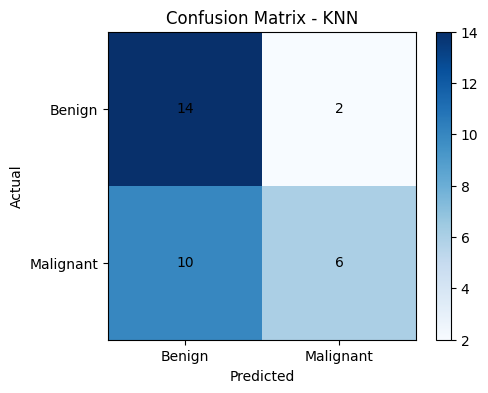

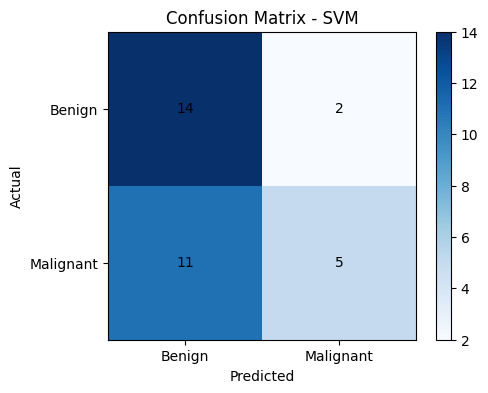

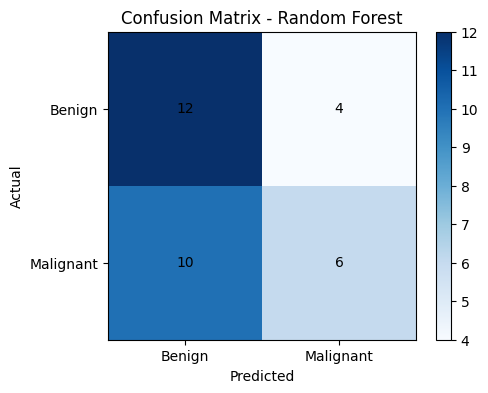

In [57]:
for nama,pred in models.items():

    cm = confusion_matrix(y_test,pred)

    plt.figure(figsize=(5,4))
    plt.imshow(cm,cmap="Blues")
    plt.title(f"Confusion Matrix - {nama}")
    plt.colorbar()

    plt.xticks([0,1],["Benign","Malignant"])
    plt.yticks([0,1],["Benign","Malignant"])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j,i,cm[i,j],ha="center",va="center")

    plt.show()

# 14. Memuat Dataset Test

Pada tahap ini seluruh citra yang terdapat pada folder Dataset/Test dibaca dan disimpan untuk proses pengujian. Selain itu, jumlah citra yang berhasil dimuat juga ditampilkan untuk memastikan data yang akan diuji telah terbaca dengan benar.

In [58]:
TEST_FOLDER = os.path.join("Dataset","Test")
test_images = []
test_names = []

for file in os.listdir(TEST_FOLDER):
    if file.lower().endswith((".jpg",".jpeg",".png")):
        img = cv2.imread(os.path.join(TEST_FOLDER,file))
        test_images.append(img)
        test_names.append(file)

print("Jumlah gambar test:",len(test_images))

Jumlah gambar test: 216


# 15. Ekstraksi Fitur Data Uji

Pada tahap ini, setiap citra pada folder pengujian dikonversi ke grayscale, kemudian dilakukan ekstraksi fitur tekstur menggunakan metode GLCM pada empat sudut orientasi, yaitu 0°, 45°, 90°, dan 135°. Fitur yang dihasilkan meliputi Contrast, Correlation, Energy, Homogeneity, Dissimilarity, dan ASM. Seluruh fitur yang diperoleh kemudian disusun ke dalam bentuk tabel dengan urutan kolom yang sama seperti data latih agar dapat digunakan pada proses prediksi oleh model klasifikasi.

In [ ]:
fitur_test = []

for img in test_images:

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    fitur = {}

    sudut_map = {
        0: 0,
        45: np.pi/4,
        90: np.pi/2,
        135: 3*np.pi/4
    }

    for sudut, angle in sudut_map.items():

        glcm = graycomatrix(gray,distances=[1],angles=[angle],symmetric=True,normed=True)
        fitur[f'Contrast_{sudut}'] = graycoprops(glcm, 'contrast')[0,0]
        fitur[f'Correlation_{sudut}'] = graycoprops(glcm, 'correlation')[0,0]
        fitur[f'Energy_{sudut}'] = graycoprops(glcm, 'energy')[0,0]
        fitur[f'Homogeneity_{sudut}'] = graycoprops(glcm, 'homogeneity')[0,0]
        fitur[f'Dissimilarity_{sudut}'] = graycoprops(glcm, 'dissimilarity')[0,0]
        fitur[f'ASM_{sudut}'] = graycoprops(glcm, 'ASM')[0,0]

    fitur_test.append(fitur)

X_test_folder = pd.DataFrame(fitur_test)

X_test_folder = X_test_folder[[
    'Contrast_0',
    'Contrast_45',
    'Contrast_90',
    'Contrast_135',

    'Correlation_0',
    'Correlation_45',
    'Correlation_90',
    'Correlation_135',

    'Energy_0',
    'Energy_45',
    'Energy_90',
    'Energy_135',

    'Homogeneity_0',
    'Homogeneity_45',
    'Homogeneity_90',
    'Homogeneity_135',

    'Dissimilarity_0',
    'Dissimilarity_45',
    'Dissimilarity_90',
    'Dissimilarity_135',

    'ASM_0',
    'ASM_45',
    'ASM_90',
    'ASM_135'
]]

display(X_test_folder.head())

,Contrast_0,Contrast_45,Contrast_90,Contrast_135,Correlation_0,Correlation_45,Correlation_90,Correlation_135,Energy_0,Energy_45,...,Homogeneity_90,Homogeneity_135,Dissimilarity_0,Dissimilarity_45,Dissimilarity_90,Dissimilarity_135,ASM_0,ASM_45,ASM_90,ASM_135
0,13.433236,18.387943,11.234805,21.137204,0.996795,0.995622,0.997318,0.994968,0.051958,0.048876,...,0.398221,0.321109,2.435718,2.861670,2.233804,3.065495,0.002700,0.002389,0.003116,0.002364
1,19.185238,17.093829,12.519479,29.646283,0.984002,0.985793,0.989552,0.975360,0.061258,0.062903,...,0.364449,0.275308,2.877783,2.708701,2.402166,3.653763,0.003753,0.003957,0.004221,0.003018
2,10.634369,15.727503,12.540559,19.776790,0.992104,0.988368,0.990690,0.985373,0.059735,0.052740,...,0.475742,0.407464,1.894018,2.435058,1.904108,2.428603,0.003568,0.002782,0.003630,0.002880
3,46.857143,113.349072,69.726517,56.444932,0.950898,0.881330,0.927272,0.940908,0.034211,0.030432,...,0.304133,0.247672,3.615231,5.031390,3.816524,4.349414,0.001170,0.000926,0.001233,0.000960
4,104.735846,124.184842,47.203876,111.807296,0.950800,0.941678,0.977814,0.947492,0.028964,0.027407,...,0.311684,0.236251,5.313081,5.775584,3.786875,5.802831,0.000839,0.000751,0.000970,0.000700


# 16. Prediksi Data Uji

Model KNN, SVM, dan Random Forest digunakan untuk melakukan klasifikasi terhadap data uji berdasarkan fitur hasil ekstraksi yang telah diperoleh sebelumnya. Hasil prediksi dari setiap model kemudian dikumpulkan dan disajikan dalam bentuk tabel yang menampilkan nama file beserta kelas yang diprediksi oleh masing-masing model.

In [ ]:
pred_knn_test = knn.predict(X_test_folder)
pred_svm_test = svm.predict(X_test_folder)
pred_rf_test = rf.predict(X_test_folder)

hasil = []

for i, nama_file in enumerate(test_names):
    hasil.append({
        "Nama File": nama_file,
        "KNN": pred_knn_test[i],
        "SVM": pred_svm_test[i],
        "Random Forest": pred_rf_test[i]
    })

df_hasil = pd.DataFrame(hasil)

display(df_hasil)

,Nama File,KNN,SVM,Random Forest
0,1.jpg,Benign,Malignant,Benign
1,10.jpg,Malignant,Malignant,Benign
2,108.jpg,Malignant,Benign,Benign
3,109.jpg,Malignant,Benign,Benign
4,11.jpg,Benign,Benign,Benign
...,...,...,...,...
211,55.jpg,Malignant,Malignant,Benign
212,6.jpg,Malignant,Malignant,Benign
213,7.jpg,Benign,Malignant,Benign
214,8.jpg,Malignant,Benign,Benign


# 17. Visualisasi Hasil Prediksi

Hasil klasifikasi dari model KNN, SVM, dan Random Forest divisualisasikan dalam bentuk diagram batang untuk menunjukkan distribusi jumlah citra pada setiap kelas prediksi. Selain itu, ditampilkan pula nilai akurasi validasi masing-masing model sebagai informasi mengenai performa model selama proses pengujian. Visualisasi ini digunakan untuk memudahkan analisis dan perbandingan hasil prediksi dari ketiga metode klasifikasi.

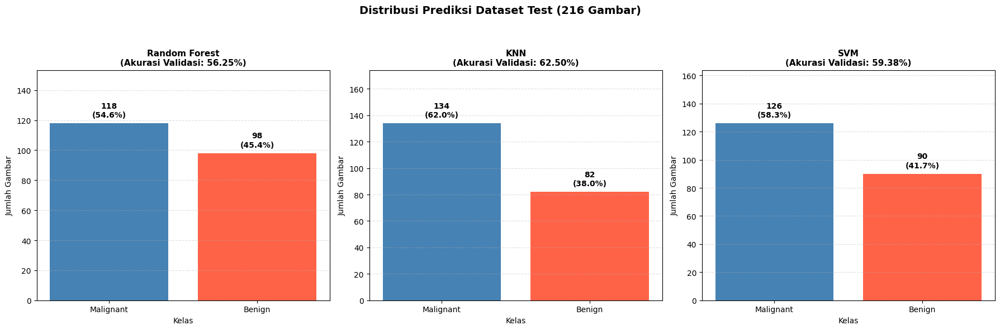

In [ ]:
akurasi_model = {
    "Random Forest": accuracy_score(y_test, pred_rf),
    "KNN": accuracy_score(y_test, pred_knn),
    "SVM": accuracy_score(y_test, pred_svm)
}

hasil_prediksi = {"Random Forest": pred_rf_test,"KNN": pred_knn_test,"SVM": pred_svm_test}
fig, axes = plt.subplots(1,3,figsize=(18,6))

for ax, (nama, prediksi) in zip(axes,hasil_prediksi.items()):
    counts = pd.Series(prediksi).value_counts()
    bars = ax.bar(counts.index.astype(str),counts.values,color=["steelblue","tomato"])
    total = counts.sum()
    ymax = counts.max() * 1.30
    ax.set_ylim(0, ymax)

    for bar in bars:
        tinggi = bar.get_height()
        persen = tinggi / total * 100

        ax.text(
            bar.get_x() + bar.get_width()/2,tinggi + ymax*0.02,
            f"{int(tinggi)}\n({persen:.1f}%)",ha="center",va="bottom", fontsize=10, fontweight="bold")

    ax.set_title(f"{nama}\n(Akurasi Validasi: {akurasi_model[nama]:.2%})",fontsize=11,fontweight="bold")
    ax.set_xlabel("Kelas")
    ax.set_ylabel("Jumlah Gambar")
    ax.grid(axis="y",linestyle="--", alpha=0.4)

plt.suptitle("Distribusi Prediksi Dataset Test (216 Gambar)",fontsize=14,fontweight="bold")
plt.tight_layout(rect=[0,0,1,0.93])
plt.show()